#Multimodal Multimodular RAG for Drone Technology
copyright 2024, Denis Rothman

The goal of this educational notebook is to have a working understanding of how to build a RAG system that can process and understand both text and image data to answer questions about drone technology.

The program implements:

* Large Language Models (LLMs) to process and understand text about drones.
   
* Multimodal datasets containing images and labels of drones.
   
* Functions to display images and identify objects within them using bounding boxes.
   
* Builds a system that can answer questions about drone technology using both text and images.
   





# Installing the environment

Run the Deep Lake installation in the following cell first.

In [1]:
#Google Drive option to store API Keys
#Store you key in a file and read it(you can type it directly in the notebook but it will be visible for somebody next to you)
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


*First run the following cells and restart Google Colab session if prompted. Then run the notebook again cell by cell to explore the code.*

In [2]:
!pip install llama-index-vector-stores-deeplake==0.1.6

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.4/32.4 MB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 72.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 97.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 6.5 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
thinc 8.3.6 require

In [1]:
!pip install deeplake==3.9.18

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.9/608.9 kB 38.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.2/84.2 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.9/139.9 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 85.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 78.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.3/82.3 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 86.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.7/119.7 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.5/144.5 kB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 7.1 MB/s eta 0:

In [1]:
!pip install llama-index==0.10.64

INFO: pip is looking at multiple versions of llama-index-indices-managed-llama-cloud to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of llama-index-indices-managed-llama-cloud to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
INFO: pip is looking at multiple versions of llama-index-readers-llama-parse to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of llama-cloud-services to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of llama-cloud-services to 

In [2]:
!pip install llama-index-llms-openai==0.1.29

  Attempting uninstall: llama-index-llms-openai
    Found existing installation: llama-index-llms-openai 0.1.31
    Uninstalling llama-index-llms-openai-0.1.31:
      Successfully uninstalled llama-index-llms-openai-0.1.31


In [3]:
from llama_index.core import VectorStoreIndex, SimpleDirectoryReader, Document
from llama_index.vector_stores.deeplake import DeepLakeVectorStore

[nltk_data] Downloading package punkt_tab to
[nltk_data]     /usr/local/lib/python3.11/dist-
[nltk_data]     packages/llama_index/core/_static/nltk_cache...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
/usr/local/lib/python3.11/dist-packages/deeplake/util/check_latest_version.py:32: UserWarning: A newer version of deeplake (4.2.14) is available. It's recommended that you update to the latest version using `pip install -U deeplake`.
  warnings.warn(


In [4]:
!pip install sentence-transformers==3.0.1

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.1/227.1 kB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 100.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 74.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 69.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [5]:
#Retrieving and setting the OpenAI API key
f = open("drive/MyDrive/OPENAI_API_KEY.txt", "r")
API_KEY=f.readline().strip()
f.close()

#The OpenAI KeyActiveloop and OpenAI API keys
import os
import openai
os.environ['OPENAI_API_KEY'] =API_KEY
openai.api_key = os.getenv("OPENAI_API_KEY")

In [6]:
#Retrieving and setting the Activeloop API token
f = open("drive/MyDrive/ACTIVELOOP_API_KEY.txt", "r")
API_token=f.readline().strip()
f.close()
ACTIVELOOP_TOKEN=API_token
os.environ['ACTIVELOOP_TOKEN'] =ACTIVELOOP_TOKEN

In [ ]:
# For Google Colab and Activeloop while waiting for Activeloop (April 2024) pending new version
#This line writes the string "nameserver 8.8.8.8" to the file. This is specifying that the DNS server the system
#should use is at the IP address 8.8.8.8, which is one of Google's Public DNS servers.
with open('/etc/resolv.conf', 'w') as file:
   file.write("nameserver 8.8.8.8")

# Loading the LLM dataset

**Replace `hub://denis76/drone_v2` by your organization and dataset name**

In [ ]:
import deeplake
dataset_path_llm = "hub://denis76/drone_v2"
ds_llm = deeplake.load(dataset_path_llm)

-

This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/denis76/drone_v2



/

hub://denis76/drone_v2 loaded successfully.



In [ ]:
import json
import pandas as pd
import numpy as np

# Create a dictionary to hold the data
data_llm = {}

# Iterate through the tensors in the dataset
for tensor_name in ds_llm.tensors:
    tensor_data = ds_llm[tensor_name].numpy()

    # Check if the tensor is multi-dimensional
    if tensor_data.ndim > 1:
        # Flatten multi-dimensional tensors
        data_llm[tensor_name] = [np.array(e).flatten().tolist() for e in tensor_data]
    else:
        # Convert 1D tensors directly to lists and decode text
        if tensor_name == "text":
            data_llm[tensor_name] = [t.tobytes().decode('utf-8') if t else "" for t in tensor_data]
        else:
            data_llm[tensor_name] = tensor_data.tolist()

# Create a Pandas DataFrame from the dictionary
df_llm = pd.DataFrame(data_llm)
df_llm

,embedding,id,metadata,text
0,"[-0.0009671939187683165, 0.010151553899049759,...",[a89cdb8c-3a85-42ff-9d5f-98f93f414df6],"[{'file_path': '/content/data/1804.06985.txt',...",[High Energy Physics Theory arXiv1804.06985 h...
1,"[-0.015508202835917473, 0.017525529488921165, ...",[e9748376-1181-46a7-a376-d03b3baa82a5],"[{'file_path': '/content/data/2202.11983.txt',...",[Computer Science Computer Vision and Pattern...
2,"[-0.015805723145604134, 0.0010567586869001389,...",[9efd2377-f3bf-4aae-ab62-2ea545d9913f],[{'file_path': '/content/data/Computer_vision....,[Computerized information extraction from imag...
3,"[-0.006319480482488871, -0.0004220486443955451...",[c6bd7bbe-4307-4664-9924-44c9bd6e0eb5],[{'file_path': '/content/data/Computer_vision....,[11 The next decade saw studies based on more...
4,"[-0.018927989527583122, 0.008104490116238594, ...",[c50a4c95-1b23-4285-8e8a-61d6e0903b0a],[{'file_path': '/content/data/Computer_vision....,[Also some of the learningbased methods develo...
...,...,...,...,...
76,"[-0.02570531703531742, -0.0009042282472364604,...",[17220db9-1a69-41cc-b546-918cd75f782e],[{'file_path': '/content/data/Unmanned_aerial_...,[Flow Measurement and Instrumentation . 54 24...
77,"[-0.03461692854762077, -0.015482962131500244, ...",[f665e55a-3474-4cd7-b0af-04885050bb1a],[{'file_path': '/content/data/Unmanned_aerial_...,[Drone Addicts . 12 March 2018. Archived from ...
78,"[-0.013619130477309227, -0.010840264149010181,...",[56161661-b799-4ca9-aa60-c0dd3ac194cb],[{'file_path': '/content/data/Unmanned_aerial_...,[CNN.com . Archived from the original on 5 Mar...
79,"[-0.01805872842669487, -0.011702487245202065, ...",[b17e21cc-8457-478e-9143-56d8a0d06d9f],[{'file_path': '/content/data/Unmanned_aerial_...,[Drone Industry Insights . Archived from the o...


In [ ]:
# Ensure 'text' column is of type string
df_llm['text'] = df_llm['text'].astype(str)
# Create documents with IDs
documents_llm = [Document(text=row['text'], doc_id=str(row['id'])) for _, row in df_llm.iterrows()]

## Initializing the LLM Query Engine

In [ ]:
from llama_index.core import VectorStoreIndex
vector_store_index_llm = VectorStoreIndex.from_documents(documents_llm)

In [ ]:
vector_query_engine_llm = vector_store_index_llm.as_query_engine(similarity_top_k=2, temperature=0.1, num_output=1024)

### User input for multimodular modular RAG

Modular RAG with multiple modalities (text, images) and sources of information; in this case, two datasets.

In [ ]:
user_input="How do drones identify a truck?"

In [ ]:
import time
import textwrap
#start the timer
start_time = time.time()
llm_response = vector_query_engine_llm.query(user_input)
# Stop the timer
end_time = time.time()
# Calculate and print the execution time
elapsed_time = end_time - start_time
print(f"Query execution time: {elapsed_time:.4f} seconds")

print(textwrap.fill(str(llm_response), 100))

Query execution time: 1.5489 seconds
Drones can identify a truck using visual detection and tracking methods, which may involve deep
neural networks for performance benchmarking.


# Loading and visualizing the multimodal dataset



In [ ]:
import deeplake

dataset_path = 'hub://activeloop/visdrone-det-train'
ds = deeplake.load(dataset_path) # Returns a Deep Lake Dataset but does not download data locally

-

Opening dataset in read-only mode as you don't have write permissions.


/

This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/activeloop/visdrone-det-train



-

hub://activeloop/visdrone-det-train loaded successfully.



In [ ]:
ds.summary()

Dataset(path='hub://activeloop/visdrone-det-train', read_only=True, tensors=['boxes', 'images', 'labels'])

 tensor      htype                 shape               dtype  compression
 -------    -------               -------             -------  ------- 
  boxes      bbox            (6471, 1:914, 4)         float32   None   
 images      image     (6471, 360:1500, 480:2000, 3)   uint8    jpeg   
 labels   class_label          (6471, 1:914)          uint32    None   


In [ ]:
ds.visualize()

HINT: Please forward the port - 56275 to your local machine, if you are running on the cloud.
 * Serving Flask app 'dataset_visualizer'
 * Debug mode: off


In [ ]:
import pandas as pd

# Create an empty DataFrame with the defined structure
df = pd.DataFrame(columns=['image', 'boxes', 'labels'])

# Iterate through the samples using enumerate
for i, sample in enumerate(ds):

    # Image data (choose either path or compressed representation)
    # df.loc[i, 'image'] = sample.images.path  # Store image path
    df.loc[i, 'image'] = sample.images.tobytes()  # Store compressed image data

    # Bounding box data (as a list of lists)
    boxes_list = sample.boxes.numpy(aslist=True)
    df.loc[i, 'boxes'] = [box.tolist() for box in boxes_list]

    # Label data (as a list)
    label_data = sample.labels.data()
    df.loc[i, 'labels'] = label_data['text']

df

,image,boxes,labels
0,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[1221.0, 84.0, 16.0, 33.0], [1235.0, 71.0, 18...","[pedestrian, pedestrian, tricycle, pedestrian,..."
1,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[351.0, 936.0, 305.0, 114.0], [0.0, 818.0, 22...","[car, car, car, car, car, car, car, car, car, ..."
2,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[699.0, 716.0, 26.0, 54.0], [600.0, 604.0, 22...","[truck, car, van, car, car, car, car, car, car..."
3,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[417.0, 77.0, 57.0, 54.0], [387.0, 109.0, 31....","[ignored regions, ignored regions, car, car, c..."
4,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[794.0, 617.0, 97.0, 115.0], [803.0, 539.0, 7...","[car, car, car, car, car, car, car, car, car, ..."
...,...,...,...
6466,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[683.0, 710.0, 7.0, 6.0], [681.0, 717.0, 5.0,...","[car, car, car, car, awning-tricycle, car, car..."
6467,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[1761.0, 676.0, 207.0, 155.0], [1539.0, 648.0...","[car, car, car, car, car, van, car, car, car, ..."
6468,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[0.0, 501.0, 105.0, 93.0], [412.0, 594.0, 172...","[car, van, pedestrian, pedestrian, pedestrian,..."
6469,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[200.0, 604.0, 112.0, 64.0], [311.0, 560.0, 1...","[van, truck, van, car, car, van, others, car, ..."


In [ ]:
labels_list = ds.labels.info['class_names']
labels_list

['ignored regions',
 'pedestrian',
 'people',
 'bicycle',
 'car',
 'van',
 'truck',
 'tricycle',
 'awning-tricycle',
 'bus',
 'motor',
 'others']

# Navigating the multimodal dataset structure

## Selecting an image

In [ ]:
# choose an image
ind=0
image = ds.images[ind].numpy() # Fetch the first image and return a numpy array

In [ ]:
import deeplake
from IPython.display import display
from PIL import Image
import cv2  # Import OpenCV

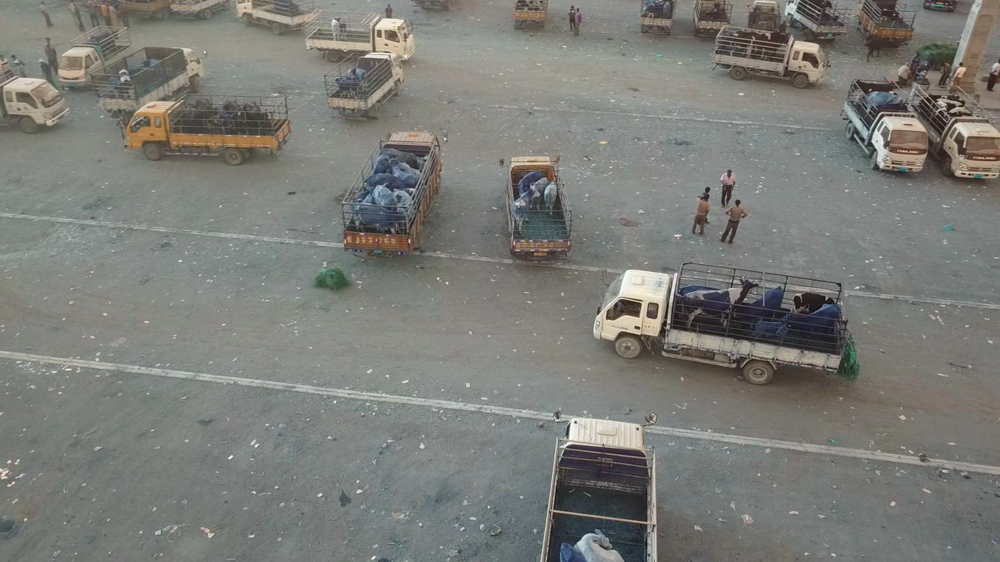

In [ ]:
image = ds.images[0].numpy()

# Convert from BGR to RGB (if necessary)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Create PIL Image and display
img = Image.fromarray(image_rgb)
display(img)

## Adding Bounding boxes and saving the image

In [ ]:
labels = ds.labels[ind].data() # Fetch the labels in the selected image
print(labels)

{'value': array([1, 1, 7, 1, 1, 1, 1, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 1, 6, 6, 6, 6,
       1, 1, 1, 1, 1, 1, 6, 6, 3, 6, 6, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 6, 6, 6], dtype=uint32), 'text': ['pedestrian', 'pedestrian', 'tricycle', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'truck', 'truck', 'truck', 'truck', 'truck', 'truck', 'truck', 'truck', 'truck', 'truck', 'pedestrian', 'truck', 'truck', 'truck', 'truck', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'truck', 'truck', 'bicycle', 'truck', 'truck', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'truck', 'truck', 'truck']}


In [ ]:
values = labels['value']
text_labels = labels['text']

# Determine the maximum text label length for formatting
max_text_length = max(len(label) for label in text_labels)

# Print the header
print(f"{'Index':<10}{'Label':<{max_text_length + 2}}")
print("-" * (10 + max_text_length + 2))  # Add a separator line

# Print the indices and labels in two columns
for index, label in zip(values, text_labels):
    print(f"{index:<10}{label:<{max_text_length + 2}}")

Index     Label       
----------------------
1         pedestrian  
1         pedestrian  
7         tricycle    
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
6         truck       
6         truck       
6         truck       
6         truck       
6         truck       
6         truck       
6         truck       
6         truck       
6         truck       
6         truck       
1         pedestrian  
6         truck       
6         truck       
6         truck       
6         truck       
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
6         truck       
6         truck       
3         bicycle     
6         truck       
6         truck       
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         p

In [ ]:
 ds.labels[ind].info['class_names'] # class names of the selected image

['ignored regions',
 'pedestrian',
 'people',
 'bicycle',
 'car',
 'van',
 'truck',
 'tricycle',
 'awning-tricycle',
 'bus',
 'motor',
 'others']

In [ ]:
def display_image_with_bboxes(image_data, bboxes, labels, label_name, ind=0):
    #Displays an image with bounding boxes for a specific label.

    image_bytes = io.BytesIO(image_data)
    img = Image.open(image_bytes)

    # Extract class names specifically for the selected image
    class_names = ds.labels[ind].info['class_names']

    # Filter for the specific label (or display all if class names are missing)
    if class_names is not None:
        try:
            label_index = class_names.index(label_name)
            relevant_indices = np.where(labels == label_index)[0]
        except ValueError:
            print(f"Warning: Label '{label_name}' not found. Displaying all boxes.")
            relevant_indices = range(len(labels))
    else:
        relevant_indices = []  # No labels found, so display no boxes

    # Draw bounding boxes
    draw = ImageDraw.Draw(img)
    for idx, box in enumerate(bboxes):  # Enumerate over bboxes
        if idx in relevant_indices:   # Check if this box is relevant
            x1, y1, w, h = box
            x2, y2 = x1 + w, y1 + h
            draw.rectangle([x1, y1, x2, y2], outline="red", width=2)
            draw.text((x1, y1), label_name, fill="red")
    # Save the image
    save_path="boxed_image.jpg"
    img.save(save_path)
    display(img)


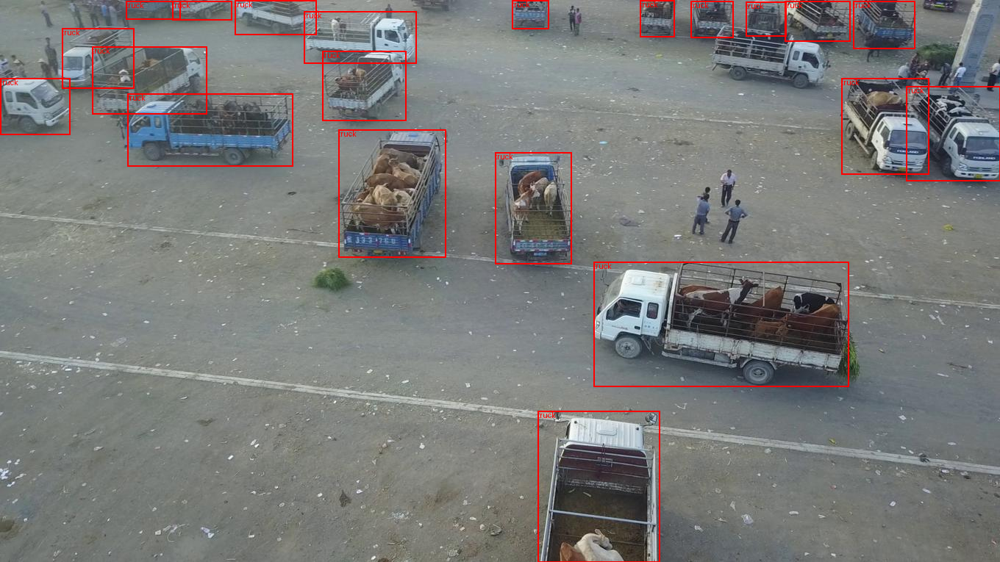

In [ ]:
import io
from PIL import ImageDraw
# Fetch labels and image data for the selected image
labels = ds.labels[ind].data()['value']
image_data = ds.images[ind].tobytes()
bboxes = ds.boxes[ind].numpy()
ibox="truck" # class in image

# Display the image with bounding boxes for the label chosen
display_image_with_bboxes(image_data, bboxes, labels, label_name=ibox)

# Building a multimodal search engine

In [ ]:
# The DataFrame is named 'df'
df['doc_id'] = df.index.astype(str)  # Create unique IDs from the row indices

# Create documents (extract relevant text for each image's labels)
documents = []
for _, row in df.iterrows():
    text_labels = row['labels'] # Each label is now a string
    text = " ".join(text_labels) # Join text labels into a single string
    document = Document(text=text, doc_id=row['doc_id'])
    documents.append(document)

In [ ]:
from llama_index.core import VectorStoreIndex
vector_store_index = VectorStoreIndex.from_documents(documents)

In [ ]:
vector_store_index.index_struct

IndexDict(index_id='4ec313b4-9a1a-41df-a3d8-a4fe5ff6022c', summary=None, nodes_dict={'5e547c1d-0d65-4de6-b33e-a101665751e6': '5e547c1d-0d65-4de6-b33e-a101665751e6', '05f73182-37ed-4567-a855-4ff9e8ae5b8c': '05f73182-37ed-4567-a855-4ff9e8ae5b8c', 'ac4bea87-6223-4e81-9232-1d10d5f43b23': 'ac4bea87-6223-4e81-9232-1d10d5f43b23', 'e828205b-52ad-43c6-be46-4da962834ae8': 'e828205b-52ad-43c6-be46-4da962834ae8', '4a6b4e87-9637-4a8c-9719-20a0324fb2fe': '4a6b4e87-9637-4a8c-9719-20a0324fb2fe', 'eee9184f-74b1-4b39-b8dd-4e0e08d4de31': 'eee9184f-74b1-4b39-b8dd-4e0e08d4de31', 'f974407b-7dc9-4c13-a51d-7131cfbefd6f': 'f974407b-7dc9-4c13-a51d-7131cfbefd6f', 'b70026e5-5609-47dd-bd9c-6a0538fdc30e': 'b70026e5-5609-47dd-bd9c-6a0538fdc30e', 'dc243208-d6fa-4d8e-96b7-ce3780e04584': 'dc243208-d6fa-4d8e-96b7-ce3780e04584', '9c581c42-b55b-42a2-8649-5f4dfe532ab9': '9c581c42-b55b-42a2-8649-5f4dfe532ab9', 'ef28adcc-8e2b-42bc-8705-f3b689cfe7a0': 'ef28adcc-8e2b-42bc-8705-f3b689cfe7a0', '31ab12b9-99ea-4e57-b114-f2ad8604e4

In [ ]:
vector_query_engine = vector_store_index.as_query_engine(similarity_top_k=1, temperature=0.1, num_output=1024)

In [ ]:
import time
start_time = time.time()
response = vector_query_engine.query(user_input)
# Stop the timer
end_time = time.time()
# Calculate and print the execution time
elapsed_time = end_time - start_time
print(f"Query execution time: {elapsed_time:.4f} seconds")

Query execution time: 1.8461 seconds


In [ ]:
print(textwrap.fill(str(response), 100))

Drones use various sensors such as cameras, LiDAR, and GPS to identify and track objects like
trucks.


In [ ]:
from itertools import groupby

def get_unique_words(text):
    text = text.lower().strip()
    words = text.split()
    unique_words = [word for word, _ in groupby(sorted(words))]
    return unique_words

for node in response.source_nodes:
    print(node.node_id)
    # Get unique words from the node text:
    node_text = node.get_text()
    unique_words = get_unique_words(node_text)
    print("Unique Words in Node Text:", unique_words)

1af106df-c5a6-4f48-ac17-f953dffd2402
Unique Words in Node Text: ['truck']


In [ ]:
# deleting any image prevsiously saved
!rm /content/boxed_image.jpg

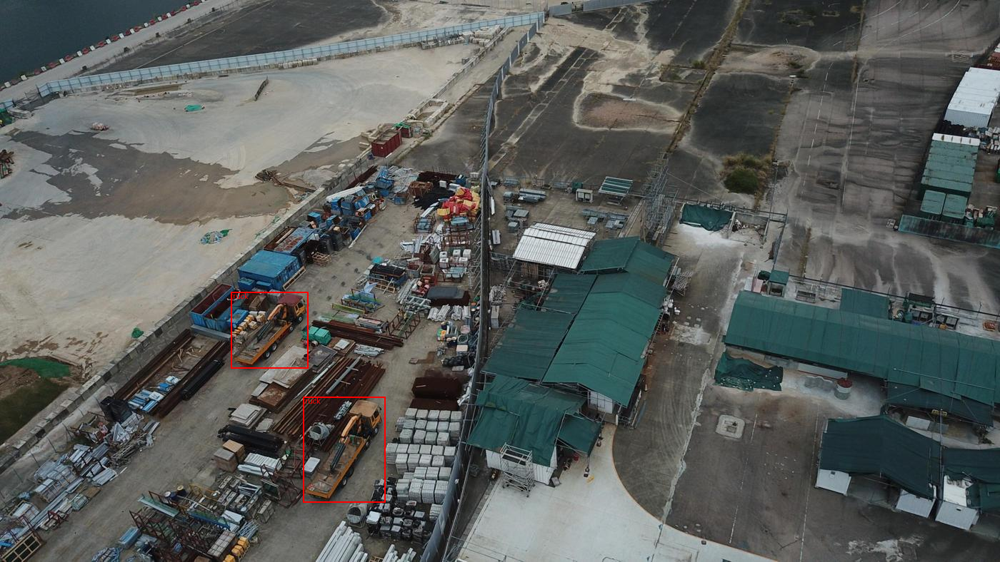

In [ ]:
import io
from PIL import Image

def process_and_display(response, df, ds, unique_words):
    """Processes nodes, finds corresponding images in dataset, and displays them with bounding boxes.

    Args:
        response: The response object containing source nodes.
        df: The DataFrame with doc_id information.
        ds: The dataset containing images, labels, and boxes.
        unique_words: The list of unique words for filtering.
    """

    for i, sample in enumerate(ds):
        for node in response.source_nodes:
            related_node_info = next(iter(node.node.relationships.values()))
            original_doc_id = related_node_info.node_id

            try:
                row_index = df[df['doc_id'] == original_doc_id].index[0]
            except IndexError:
                continue  # Skip if doc_id not found in the DataFrame

            if i == row_index:
                image_bytes = io.BytesIO(sample.images.tobytes())
                img = Image.open(image_bytes)

                labels = ds.labels[i].data()['value']
                image_data = ds.images[i].tobytes()
                bboxes = ds.boxes[i].numpy()
                ibox = unique_words[0]  # class in image

                display_image_with_bboxes(image_data, bboxes, labels, label_name=ibox)

# Assuming you have your 'response', 'df', 'ds', and 'unique_words' objects prepared:
process_and_display(response, df, ds, unique_words)

# Multimodal Modular Summary

Assuming the processes have been activated.

In [ ]:
from PIL import Image
def display_source_image(image_path):
  try:
    with Image.open(image_path) as img:
        display(img)
  except FileNotFoundError:
    print("Error: The image file was not found at the specified path.")
  except Exception as e:  # Catch other potential errors
    print(f"Error loading image: {e}")

How do drones identify a truck?
Drones can identify a truck using visual detection and tracking methods, which may involve deep
neural networks for performance benchmarking.


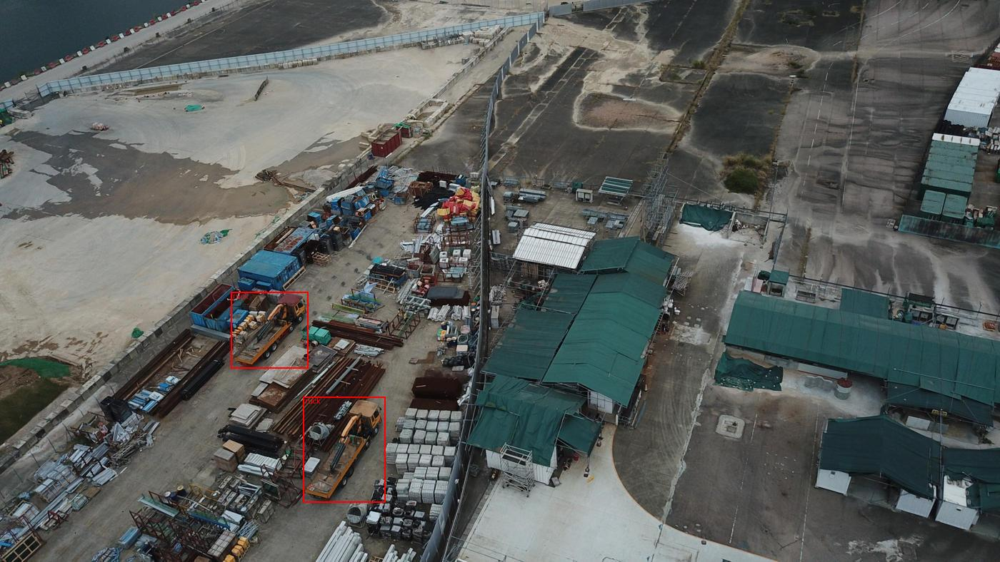

In [ ]:
# 1.user input=user_input
print(user_input)
# 2.LLM response
print(textwrap.fill(str(llm_response), 100))
# 3.Multimodal reponse
image_path = "/content/boxed_image.jpg"
display_source_image(image_path)

# Performance metric

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-MiniLM-L6-v2')

def calculate_cosine_similarity_with_embeddings(text1, text2):
    embeddings1 = model.encode(text1)
    embeddings2 = model.encode(text2)
    similarity = cosine_similarity([embeddings1], [embeddings2])
    return similarity[0][0]

/usr/local/lib/python3.10/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

## LLM performance

In [ ]:
llm_similarity_score = calculate_cosine_similarity_with_embeddings(user_input, str(llm_response))
print(user_input)
print(llm_response)
print(f"Cosine Similarity Score: {llm_similarity_score:.3f}")

How do drones identify a truck?
Drones can identify a truck using visual detection and tracking methods, which may involve deep neural networks for performance benchmarking.
Cosine Similarity Score: 0.691


## Multimodal performance

In [ ]:
import base64

IMAGE_PATH = "/content/boxed_image.jpg"

# Open the image file and encode it as a base64 string
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

base64_image = encode_image(IMAGE_PATH)

In [ ]:
from openai import OpenAI
#Set the API key for the client
client = OpenAI(api_key=openai.api_key)
MODEL="gpt-4o"

In [ ]:
u_word=unique_words[0]
print(u_word)

truck


In [ ]:
response = client.chat.completions.create(
    model=MODEL,
    messages=[
        {"role": "system", "content": f"You are a helpful assistant that analyzes images that contain {u_word}."},
        {"role": "user", "content": [
            {"type": "text", "text": f"Analyze the following image, tell me if there is one {u_word} or more in the bounding boxes and analyse them:"},
            {"type": "image_url", "image_url": {
                "url": f"data:image/png;base64,{base64_image}"}
            }
        ]}
    ],
    temperature=0.0,
)
response_image = response.choices[0].message.content
print(response_image)

The image contains two trucks within the bounding boxes. Here is the analysis of each truck:

1. **First Truck (Top Bounding Box)**:
   - The truck appears to be a flatbed truck.
   - It is loaded with various materials, possibly construction or industrial supplies.
   - The truck is parked in an area with other construction materials and equipment.

2. **Second Truck (Bottom Bounding Box)**:
   - This truck also appears to be a flatbed truck.
   - It is carrying different types of materials, similar to the first truck.
   - The truck is situated in a similar environment, surrounded by construction materials and equipment.

Both trucks are in a construction or industrial area, likely used for transporting materials and equipment.


In [ ]:
resp=user_input+u_word+"s"
multimodal_similarity_score = calculate_cosine_similarity_with_embeddings(resp, str(response_image))
print(f"Cosine Similarity Score: {multimodal_similarity_score:.3f}")

Cosine Similarity Score: 0.505


## Multimodal Modular RAG performance

In [ ]:
score=(llm_similarity_score+multimodal_similarity_score)/2
print(f"Multimodal, Modular Score: {score:.3f}")

Multimodal, Modular Score: 0.598
